# HH fitting Kboth recordings

In [1]:
%load_ext autoreload
%autoreload 1

%aimport analysis_helpers
%aimport Kv21
%aimport Kv14

import matplotlib.pyplot as plt
import numpy as np
import scipy.optimize
import stfio
import analysis_helpers as ah
import copy
import time

/usr/lib64/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: The mpl_toolkits.axes_grid module was deprecated in version 2.1. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist provies the same functionality instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


In [3]:
ana = [
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (33,34,None,35)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (44,45,None,46)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (47,48,None,49)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (50,51,None,52)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (53,54,None,55)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_12_%04d.atf', (0,1,None,2)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_12_%04d.atf', (4,5,None,6)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_12_%04d.atf', (7,8,None,9)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_12_%04d.atf', (12,13,None,14)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_12_%04d.atf', (15,16,None,17)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_12_%04d.atf', (18,19,None,20)),
    
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (27,28,29,30)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (31,32,33,34)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (35,36,37,38)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (39,40,41,42)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (43,44,45,46)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (47,48,49,50)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (51,52,53,54)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (55,56,57,58)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (59,60,61,62)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (63,64,65,66)),
    
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_01/2019_02_01_%04d.atf', (43,44,45), (46,47,48,49,50,51)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_01/2019_02_01_%04d.atf', (52,53,54), (55,56,57,58,59,60)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_01/2019_02_01_%04d.atf', (61,62,63), (64,65,66,67,68,69)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_01/2019_02_01_%04d.atf', (103,104,105), (106,107,108,109)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_08/2019_02_08_%04d.atf', (53,54,55), (56,57)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_08/2019_02_08_%04d.atf', (58,59,60), (61,62)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_08/2019_02_08_%04d.atf', (63,64,65), (66,67)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_15/2019_02_15_%04d.atf', (4,5,6), (7,8)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_15/2019_02_15_%04d.atf', (10,11,12), (13,14)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_15/2019_02_15_%04d.atf', (16,17,18), (19,20)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_15/2019_02_15_%04d.atf', (59,60,61), (62,63)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (0,1,2), (3,4,5)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (7,8,9), (10,11,12,13,14,15,16,17)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (19,20,21), (22,23,24,25,26,27,28,29)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (30,31,32), (33,34,35,36,37,38,39,40)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (41,42,43), (44,45,46,47,48,49,50,51)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (52,53,54), (55,56,57,58,59,60,61,62)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (63,64,65), (66,67,68,69,70,71,72,73)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (74,75,76), (77,78,79,80,81,82,83,84)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (85,86,87), (88,89,90,91,92,93,94,95)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (96,97,98), (99,100,101,102,103,104,105,106)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (107,108,109), (110,111,112,113,114,115,116,117)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_22/2019_02_22_%04d.atf', (118,119,120), (121,122,123,124,125,126,127,128)),
]

In [35]:
for a in ana:
    print a.paramsfile
    a.fit()

/home/kernfel/Documents/Data/Oocytes/2017_12_06_0035.params
Trace 11 truncated fast tau 3.2530906678693157
Trace 12 truncated fast tau 3.2530906678693157
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0046.params
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0049.params
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0052.params
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0055.params
/home/kernfel/Documents/Data/Oocytes/2017_12_12_0002.params
Trace 9 truncated fast tau 5.722393495490515
/home/kernfel/Documents/Data/Oocytes/2017_12_12_0006.params
/home/kernfel/Documents/Data/Oocytes/2017_12_12_0009.params
/home/kernfel/Documents/Data/Oocytes/2017_12_12_0014.params
Trace 9 truncated fast tau 4.23019431886705
/home/kernfel/Documents/Data/Oocytes/2017_12_12_0017.params
/home/kernfel/Documents/Data/Oocytes/2017_12_12_0020.params
/home/kernfel/Documents/Data/Oocytes/2018_05_03_0030.params
/home/kernfel/Documents/Data/Oocytes/2018_05_03_0034.params
/home/kernfel/Documents/Data/Oocytes/

In [36]:
for a in ana:
    print '%s:\n%s\n' % (a.paramsfile, a.params_str())

/home/kernfel/Documents/Data/Oocytes/2017_12_06_0035.params:
gl:	1.531945 μS
El:	-35.770758 mV
gK:	12.304887 μS
EK:	-62.892955 mV
C:	185.526247 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0046.params:
gl:	0.908461 μS
El:	-25.273036 mV
gK:	59.890980 μS
EK:	-74.451768 mV
C:	210.209230 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0049.params:
gl:	0.629462 μS
El:	-30.980008 mV
gK:	102.489931 μS
EK:	-74.801409 mV
C:	201.682450 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0052.params:
gl:	0.845774 μS
El:	-21.558611 mV
gK:	64.824614 μS
EK:	-74.109748 mV
C:	202.228441 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0055.params:
gl:	1.014268 μS
El:	-10.447204 mV
gK:	29.615195 μS
EK:	-64.793342 mV
C:	183.104249 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_12_0002.params:
gl:	0.656339 μS
El:	-21.103632 mV
gK:	81.660812 μS
EK:	-74.267050 mV
C:	191.937576 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_12_0006.params:
gl:	4.310238 μS
El:	-4.672105 mV
gK:	76.0244

## HH fit with defined kinetics

In [37]:
if (Kv14.tres == Kv21.tres) and (Kv14.rec_step_t0 == Kv21.rec_step_t0):
    print "tres and rec_step_t0 correctly aligned"
else:
    print "WARNING: tres or rec_step_t0 mismatch!"

tres and rec_step_t0 correctly aligned


In [38]:
def get_limits(a):
    tmax = 20000
    tblank = Kv14.rec_limits[0] - Kv14.rec_step_t0 # use tighter Kv14 rec_limits
    t2max = 10000
    t2blank = a.rec2.tail_cut - Kv21.rec2_limits[0] # use Kv21 (100ms) tail protocol limits
    return tmax, tblank, t2max, t2blank

In [39]:
def get_targets(a):
    '''prepare target traces, subtracting leak current with per-trace conductance'''
    tmax, tblank, t2max, t2blank = get_limits(a)
    
    gleak = ah.get_gleak(a.rec, a.params['E_leak'], (0, Kv14.rec_step_t0))
    Irec_target = np.array([
                            I[Kv14.rec_limits[0] : Kv14.rec_limits[0] + tmax]
       - a.params['I_leak'](V[Kv14.rec_limits[0] : Kv14.rec_limits[0] + tmax], g)
                            for I, V, g in zip(a.rec.current, a.rec.voltage, gleak)])
    
    gleak2 = ah.get_gleak(a.rec2, a.params['E_leak'], (0, Kv21.rec2_prepulse))
    Irec2_target = np.array([
                             I[a.rec2.tail_cut : a.rec2.tail_cut + t2max]
        - a.params['I_leak'](V[a.rec2.tail_cut : a.rec2.tail_cut + t2max], g)
                             for I, V, g in zip(a.rec2.current, a.rec2.voltage, gleak2)])
    
    return Irec_target, Irec2_target

In [40]:
def get_hold_voltages(a):
    Vhold = np.array([np.median(voltage[:Kv14.rec_step_t0]) for voltage in a.rec.voltage])
    Vhold2 = np.array([np.median(voltage[:Kv21.rec2_prepulse]) for voltage in a.rec2.voltage])
    return Vhold, Vhold2

In [42]:
def get_states(a, hold_voltages):
    '''Return modelled states across the selected time periods'''
    tmax, tblank, t2max, t2blank = get_limits(a)
    
    # Find hold states
    rec_hold_state_21 = zip(*Kv21.state_at(10000, hold_voltages[0], (.5,.5,.5,.5)))
    rec_hold_state_14 = zip(*Kv14.state_at(10000, hold_voltages[0], (.5,.5,.5,.5)))
    rec2_hold_state_21 = zip(*Kv21.state_at(10000, hold_voltages[1], (.5,.5,.5,.5)))
    rec2_hold_state_14 = zip(*Kv14.state_at(10000, hold_voltages[1], (.5,.5,.5,.5)))
    
    # Populate the HH states over the fitting period
    rec_states_21 = np.zeros((len(a.rec.voltage), tmax, 3))
    rec_states_14 = np.zeros((len(a.rec.voltage), tmax, 4))
    for i, voltage, state21, state14 in \
            zip(range(len(a.rec.voltage)), a.rec.voltage, rec_hold_state_21, rec_hold_state_14):
        for t in range(tblank):
            V = voltage[Kv14.rec_step_t0 + t]
            state21 = Kv21.state_at(Kv14.tres, V, state21)
            state14 = Kv14.state_at(Kv14.tres, V, state14)

        for t in range(tmax):
            V = voltage[Kv14.rec_limits[0] + t]
            state21 = Kv21.state_at(Kv14.tres, V, state21)
            state14 = Kv14.state_at(Kv14.tres, V, state14)
            rec_states_21[i][t] = state21
            rec_states_14[i][t] = state14
    
    rec2_states_21 = np.zeros((len(a.rec2.voltage), t2max, 3))
    rec2_states_14 = np.zeros((len(a.rec2.voltage), t2max, 4))
    for i, voltage, state21, state14 in \
            zip(range(len(a.rec2.voltage)), a.rec2.voltage, rec2_hold_state_21, rec2_hold_state_14):
        for t in range(Kv21.rec2_prepulse, Kv21.rec2_limits[0]):
            state21 = Kv21.state_at(Kv21.tres, voltage[t], state21)
            state14 = Kv14.state_at(Kv21.tres, voltage[t], state14)

        for t in range(t2blank):
            V = voltage[Kv21.rec2_limits[0] + t]
            state21 = Kv21.state_at(Kv21.tres, V, state21)
            state14 = Kv14.state_at(Kv21.tres, V, state14)

        for t in range(t2max):
            V = voltage[a.rec2.tail_cut + t]
            state21 = Kv21.state_at(Kv21.tres, V, state21)
            state14 = Kv14.state_at(Kv21.tres, V, state14)
            rec2_states_21[i][t] = state21
            rec2_states_14[i][t] = state14
    
    return rec_states_21, rec_states_14, rec2_states_21, rec2_states_14

In [56]:
def get_currents(a, states, pfixed):
    # pfixed: EK, gK_fast, gK_slow, gA_slow, gA_fast
    '''Return modelled currents based on states and g/E values'''
    tmax, tblank, t2max, t2blank = get_limits(a)
    
    # Apply conductance to the states to compute the current
    Irec = np.reshape([(voltage[Kv14.rec_limits[0] + t] - pfixed[0])
               * (pfixed[1] * states21[t][0]**4 * states21[t][1] + pfixed[2] * states21[t][2]**4
                 + pfixed[3] * states14[t][0]**4 * states14[t][1] + pfixed[4] * states14[t][2]**4 * states14[t][3])

                      for voltage, states21, states14 in zip(a.rec.voltage, states[0], states[1])
                      for t in range(len(states21))],
                     (len(a.rec.voltage), tmax))

    Irec2 = np.reshape([(voltage[a.rec2.tail_cut + t] - pfixed[0])
               * (pfixed[1] * states21[t][0]**4 * states21[t][1] + pfixed[2] * states21[t][2]**4
                 + pfixed[3] * states14[t][0]**4 * states14[t][1] + pfixed[4] * states14[t][2]**4 * states14[t][3])

                       for voltage, states21, states14 in zip(a.rec2.voltage, states[2], states[3])
                       for t in range(len(states21))],
                      (len(a.rec2.voltage), t2max))
    
    return Irec, Irec2

Text(0.5,0.98,'Unfitted initial values')

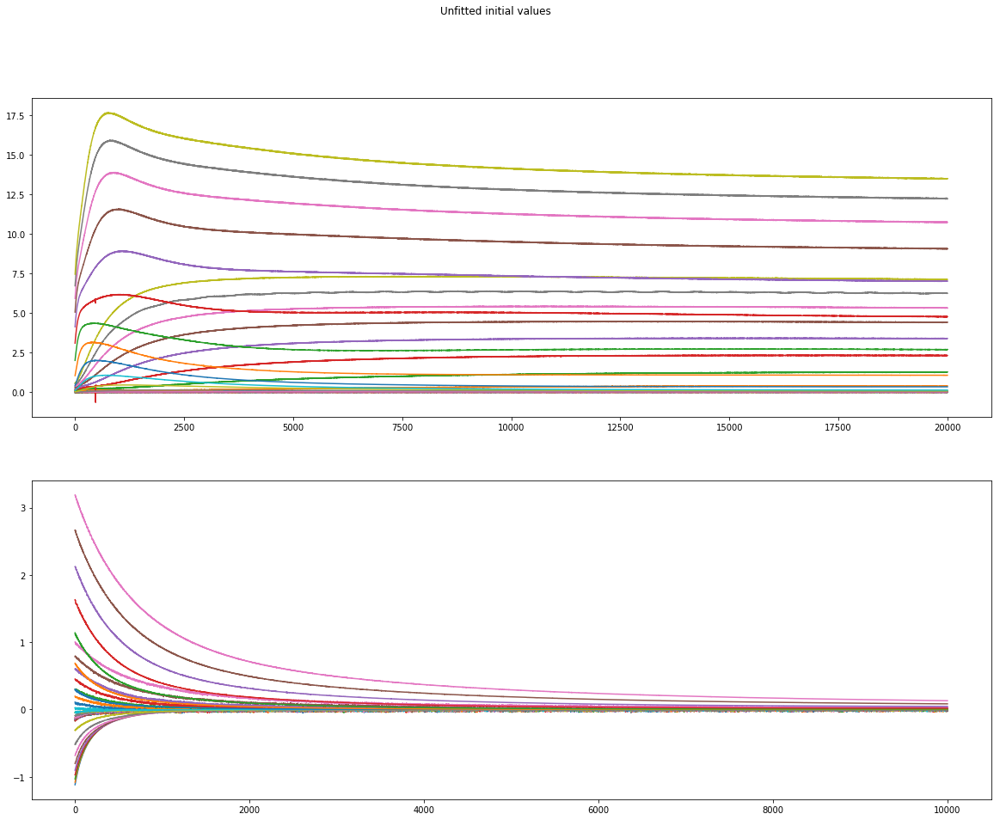

In [59]:
# Sanity check
states = get_states(ana[1], get_hold_voltages(ana[1]))
I1, I2 = get_currents(ana[1], states, (-74., 0.08, 0.03, 0.03, 0.08))
I1_target, I2_target = get_targets(ana[1])

plt.figure(figsize=(20,15))
plt.subplot(2,1,1)
for I in I1_target:
    plt.plot(I)
plt.gca().set_prop_cycle(None)
for I in I1:
    plt.plot(I)

plt.subplot(2,1,2)
for I in I2_target:
    plt.plot(I)
plt.gca().set_prop_cycle(None)
for I in I2:
    plt.plot(I)
    
plt.suptitle("Unfitted initial values")

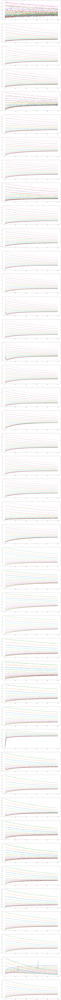

In [58]:
plt.figure(figsize=(20,8*len(ana)))
for i,a in enumerate(ana):
    I1_target, I2_target = get_targets(a)
    plt.subplot(len(ana),1, i+1)
    for I in I2_target:
        plt.plot(I[:500])

### Fitting just the conductances...

In [66]:
def g_residuals_fixed(p, a, states, targets):
    I1, I2 = get_currents(a, states, np.concatenate(((a.params['E_K'],), p)))
    
    # compare to target
    I1 -= targets[0]
    I2 -= targets[1]
    
    return np.concatenate((I1.ravel(), I2.ravel()))

In [67]:
gfits = [0] * len(ana)
for i,a in enumerate(ana):
    hold_voltages = get_hold_voltages(a)
    targets = get_targets(a)
    states = get_states(a, hold_voltages)
    
    start = time.time()
    gfits[i] = scipy.optimize.least_squares(g_residuals_fixed, (0.085, 0.036, 0.02, 0.06),
                                           args = (a, states, targets),
                                           bounds = ([0, 0, 0, 0],
                                                     [0.5, 0.5, 0.5, 0.5]))
    print i, time.time() - start, gfits[i].cost

0 211.374077082 155.0476263155409
1 141.865589857 4070.9230382371697
2 106.677636147 22594.344185941754
3 166.153723001 9671.611838529834
4 128.873275995 5489.508931221013
5 119.223919868 15041.370151275347
6 119.363826036 6780.214028506765
7 93.709526062 7067.6524633649815
8 155.674104929 1209.3080149804582
9 71.9466569424 32110.23472313702
10 143.627629042 10581.054016245474
11 102.666341066 82979.59196033454
12 90.8484611511 72376.0557583414
13 86.8970451355 56696.90380457074
14 98.0905330181 133132.92657560567
15 135.25770092 8408.946653880412
16 96.7348430157 84251.64378121844
17 85.179338932 57468.58188080448
18 145.329142094 88255.31524274213
19 85.4994559288 137462.5508619097
20 86.3263499737 92966.7662306957
21 117.806295156 187715.07638648714
22 107.016724825 35203.1512690246
23 130.375250816 1095555.3965952196
24 88.3565950394 371477.565570363
25 99.0929679871 23759.676796708703
26 98.8652398586 49643.005839056146
27 113.501859188 1060471.3765440779
28 140.507302999 10944.34

In [68]:
for a, gf in zip(ana, gfits):
    print a.paramsfile, a.params['E_K'], gf.x

/home/kernfel/Documents/Data/Oocytes/2017_12_06_0035.params -62.89295496850278 [6.53297479e-03 6.02534173e-03 2.24892752e-20 2.54912147e-04]
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0046.params -74.45176818593585 [3.92583452e-02 1.80543142e-02 3.36179688e-26 1.65784978e-23]
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0049.params -74.80140855872546 [6.00234289e-02 3.57969118e-02 1.89462203e-27 4.00574872e-02]
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0052.params -74.10974810257945 [4.45923603e-02 1.69545545e-02 2.82040116e-30 4.61093159e-20]
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0055.params -64.79334193339399 [1.45725844e-02 1.22231043e-02 1.90588847e-20 7.27604667e-18]
/home/kernfel/Documents/Data/Oocytes/2017_12_12_0002.params -74.26704964029946 [4.62689510e-02 2.83268576e-02 5.79652798e-17 4.58837509e-02]
/home/kernfel/Documents/Data/Oocytes/2017_12_12_0006.params -72.58220999849115 [0.04154879 0.02910214 0.00202685 0.0371692 ]
/home/kernfel/Documents/Data/

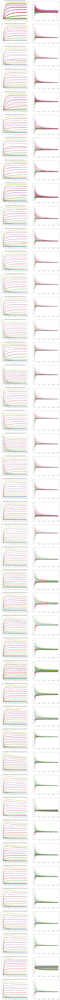

In [70]:
plt.figure(figsize=(20,8*len(ana)))

for i,a in enumerate(ana):
    states = get_states(a, get_hold_voltages(a))
    I1, I2 = get_currents(a, states, np.concatenate(((a.params['E_K'],), gfits[i].x)))
    I1_target, I2_target = get_targets(a)

    plt.subplot(len(ana),2, 2*i+1).set_title(a.paramsfile)
    for I in I1_target:
        plt.plot(I)
    plt.gca().set_prop_cycle(None)
    for I in I1:
        plt.plot(I)

    plt.subplot(len(ana),2, 2*i+2)
    for I in I2_target:
        plt.plot(I)
    plt.gca().set_prop_cycle(None)
    for I in I2:
        plt.plot(I)

In [71]:
for a, gf in zip(ana, gfits):
    a.params['gK_fast'] = gf.x[0]
    a.params['gK_slow'] = gf.x[1]
    a.params['gA_slow'] = gf.x[2]
    a.params['gA_fast'] = gf.x[3]
    a.write({'gA_slow': (1e3, ' μS'), 'gA_fast': (1e3, ' μS')})